# YOLOL, A look into ibject Detection models:
##### Yassin Bahid

## Itroduction:
While prrevious object detection models reused classifers to perform detections. Im his paper, Redmond reframes the problem as a regression problem aiming to spacially seperate bounding boxes associated with certain classes. In order to achive this result, Redmond proposes a new loss function that optimizes classification and object boxing. YOLO is suprisingly fast and can process 45 frames per second. We shall create a YOLO Neural Net, train it, and test it's Accuracy.

In [33]:
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import pandas as pd
from PIL import Image
import torch.optim as optim
from torch.utils.data import DataLoader
from collections import Counter
from tqdm import tqdm
import matplotlib.patches as patches

In [2]:
if(torch.cuda.is_available()):
    DEVICE = torch.device("cuda")
    print(DEVICE, torch.cuda.get_device_name(0))
else:
    DEVICE= torch.device("cpu")
    print(DEVICE)

cuda NVIDIA GeForce RTX 3060 Ti


## Dataset:

We use the VOCD dataset consisting of 20 classes with boxed in images. We train our model on the entire Data Set.

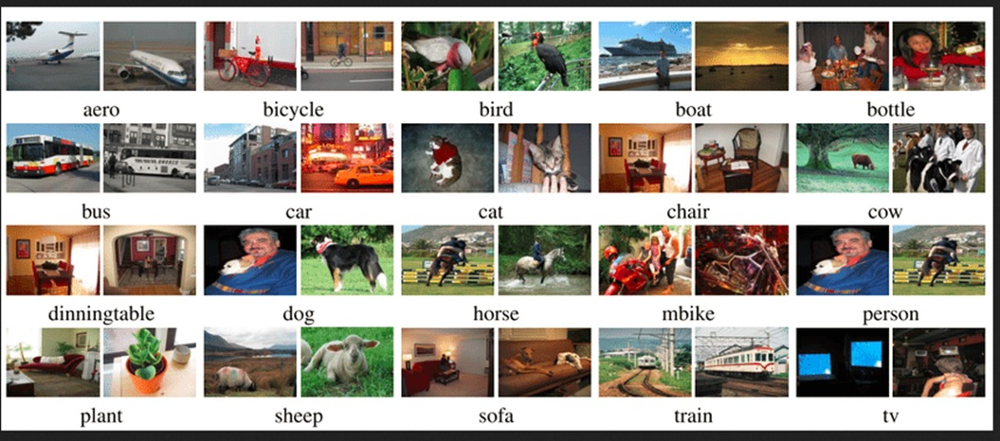

In [7]:
class VOCDataset(torch.utils.data.Dataset):
    def __init__(
        self, csv_file, img_dir, label_dir, S=7, B=2, C=20, transform=None,
    ):
        self.annotations = pd.read_csv(csv_file)
        self.img_dir = img_dir
        self.label_dir = label_dir
        self.transform = transform
        self.S = S
        self.B = B
        self.C = C

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, index):
        label_path = os.path.join(self.label_dir, self.annotations.iloc[index, 1])
        boxes = []
        with open(label_path) as f:
            for label in f.readlines():
                class_label, x, y, width, height = [
                    float(x) if float(x) != int(float(x)) else int(x)
                    for x in label.replace("\n", "").split()
                ]

                boxes.append([class_label, x, y, width, height])

        img_path = os.path.join(self.img_dir, self.annotations.iloc[index, 0])
        image = Image.open(img_path)
        boxes = torch.tensor(boxes)

        if self.transform:
            # image = self.transform(image)
            image, boxes = self.transform(image, boxes)

        # Convert To Cells
        label_matrix = torch.zeros((self.S, self.S, self.C + 5 * self.B))
        for box in boxes:
            class_label, x, y, width, height = box.tolist()
            class_label = int(class_label)

            # i,j represents the cell row and cell column
            i, j = int(self.S * y), int(self.S * x)
            x_cell, y_cell = self.S * x - j, self.S * y - i

            """
            Calculating the width and height of cell of bounding box,
            relative to the cell is done by the following, with
            width as the example:
            
            width_pixels = (width*self.image_width)
            cell_pixels = (self.image_width)
            
            Then to find the width relative to the cell is simply:
            width_pixels/cell_pixels, simplification leads to the
            formulas below.
            """
            width_cell, height_cell = (
                width * self.S,
                height * self.S,
            )

            # If no object already found for specific cell i,j
            # Note: This means we restrict to ONE object
            # per cell!
            if label_matrix[i, j, 20] == 0:
                # Set that there exists an object
                label_matrix[i, j, 20] = 1

                # Box coordinates
                box_coordinates = torch.tensor(
                    [x_cell, y_cell, width_cell, height_cell]
                )

                label_matrix[i, j, 21:25] = box_coordinates

                # Set one hot encoding for class_label
                label_matrix[i, j, class_label] = 1

        return image, label_matrix

## Results:

Text(0, 0.5, 'Mean Avg Precision')

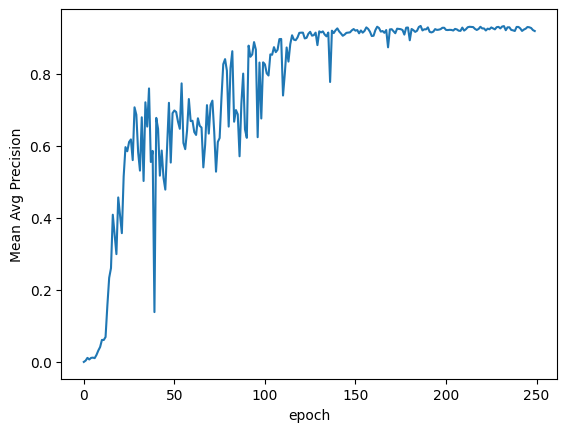

In [21]:
plt.plot([i for i in range(0, EPOCHS)], Loss_list)
plt.xlabel('epoch')
plt.ylabel('Mean Avg Precision')

We run our model for 250 epochs. There is a significant increase in precision for the first 150 epoch, but it plateaus afterwards at 0.91. The outputs below show a snippet of the boxing process. While or model does very well with images wit only one classe, it struggles a bit with multiple objects in the same class. It is Also very fast as it generates 100 examples in less than a second.

doing stuff


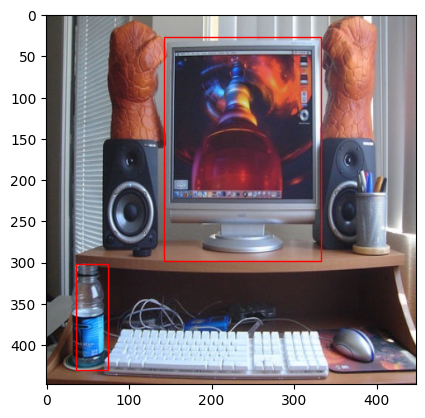

doing stuff


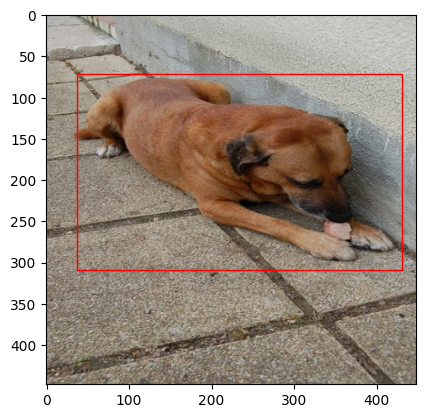

doing stuff


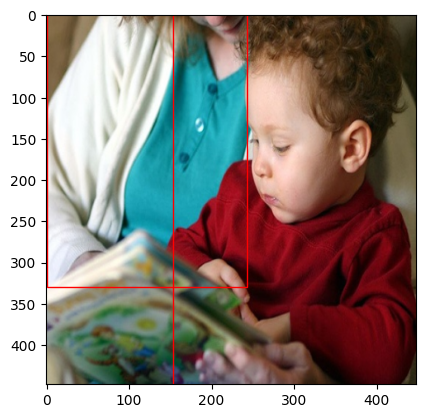

doing stuff


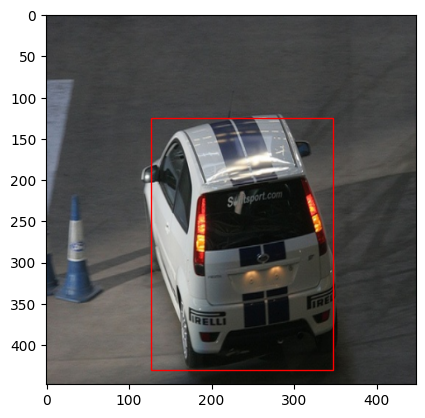

doing stuff


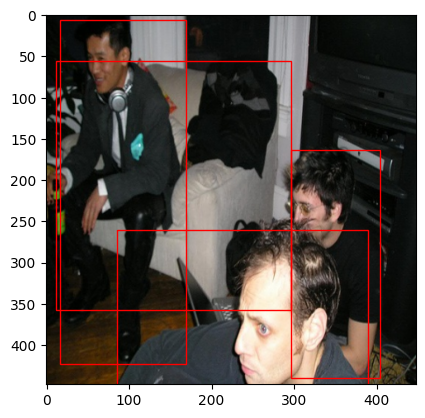

doing stuff


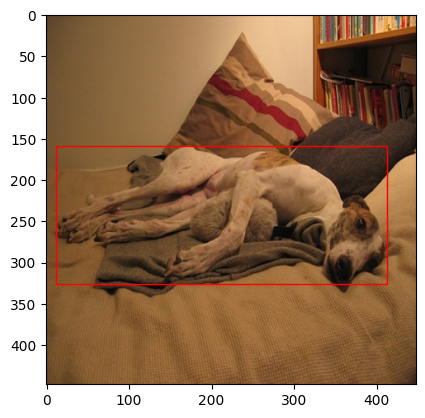

doing stuff


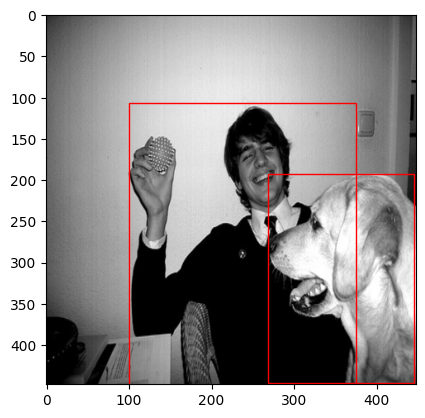

doing stuff


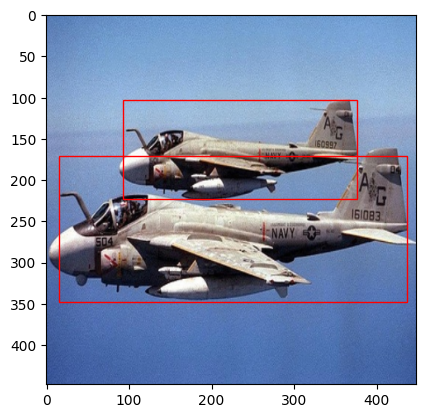

doing stuff


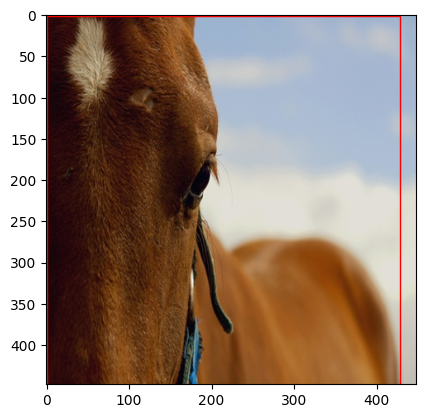

doing stuff


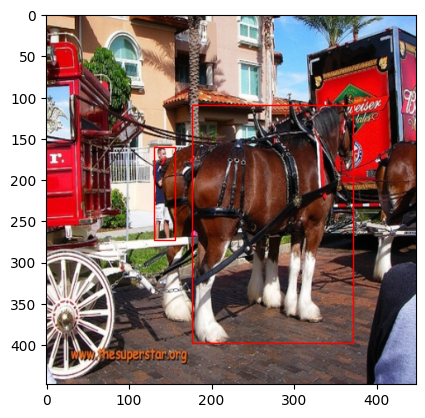

doing stuff


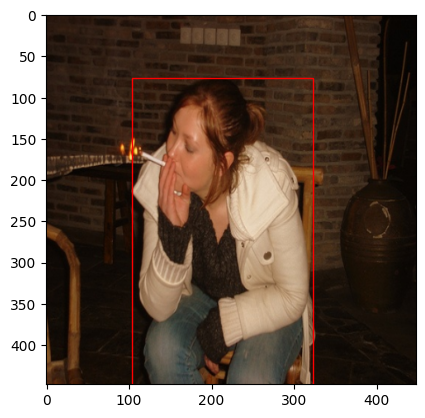

doing stuff


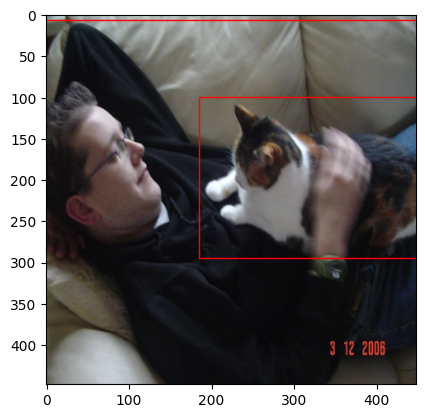

doing stuff


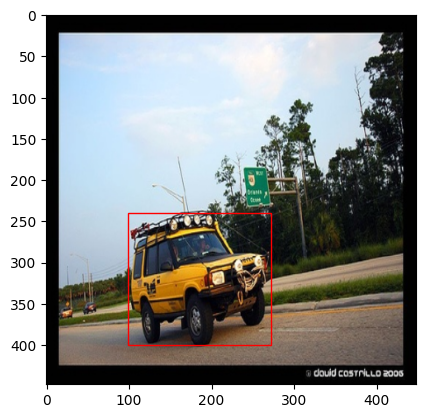

doing stuff


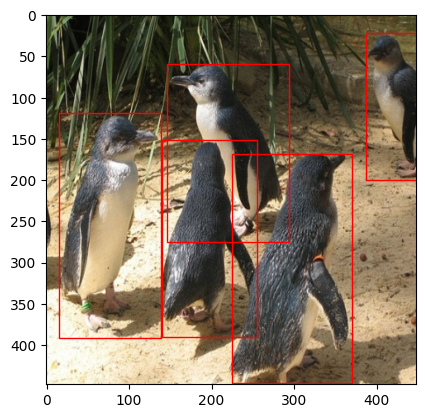

doing stuff


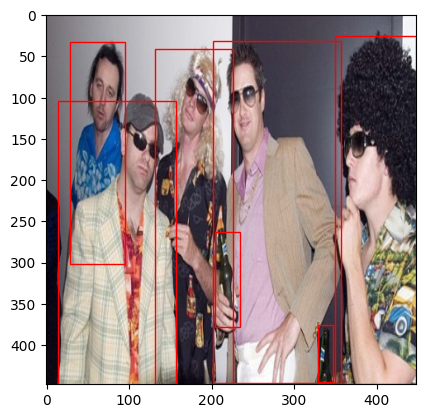

doing stuff


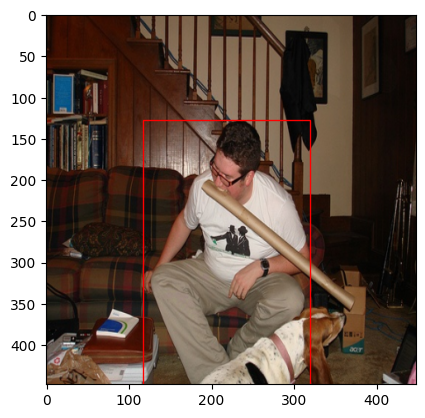

doing stuff


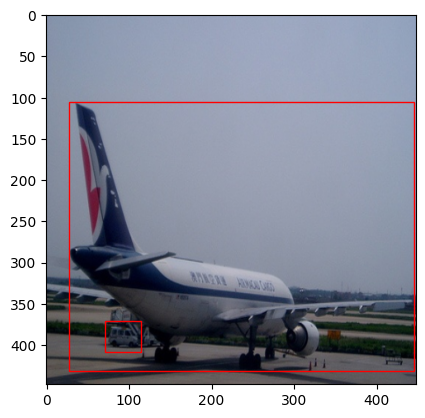

doing stuff


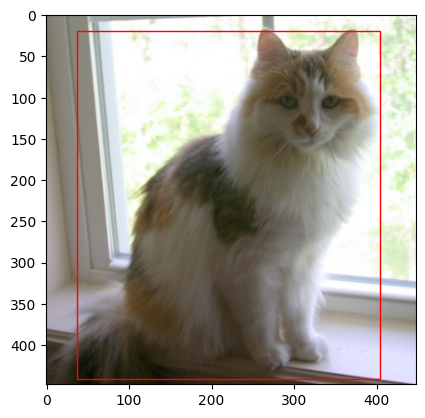

doing stuff


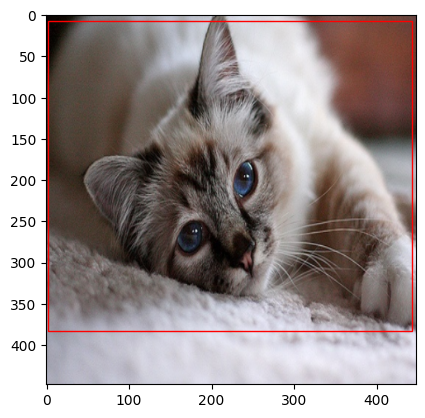

doing stuff


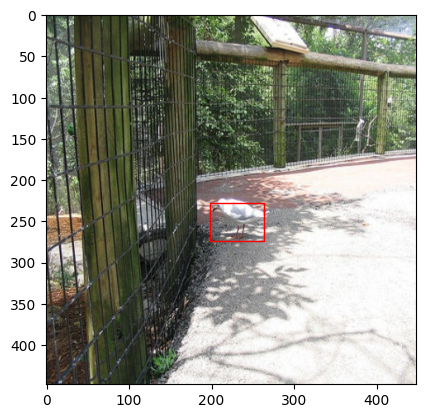

doing stuff


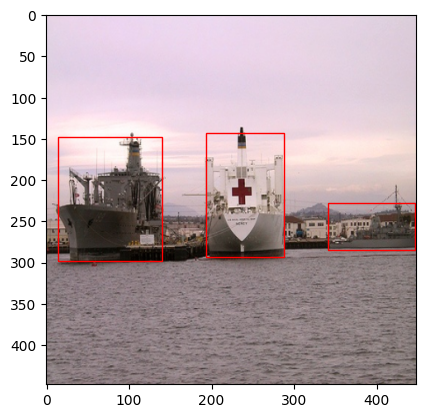

doing stuff


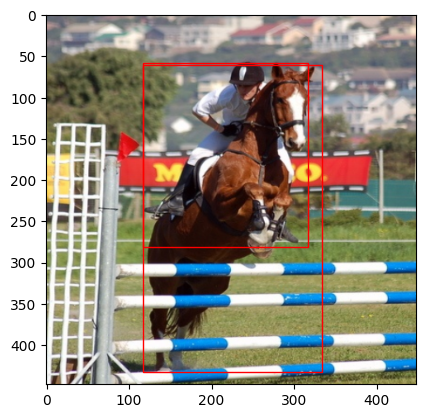

doing stuff


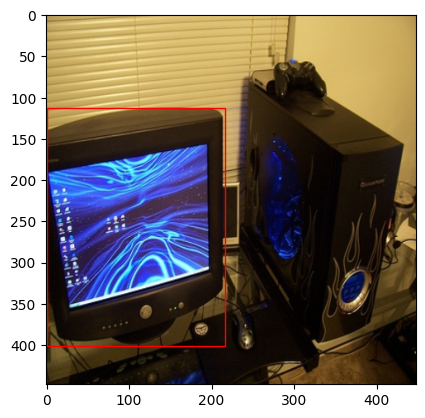

doing stuff


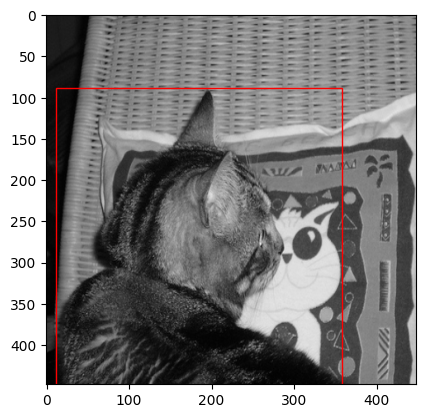

doing stuff


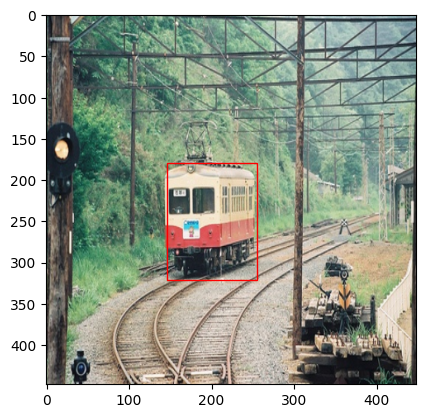

doing stuff


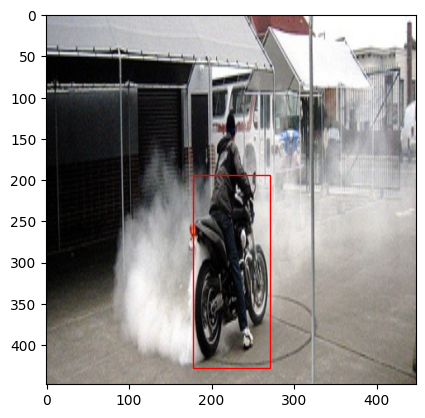

doing stuff


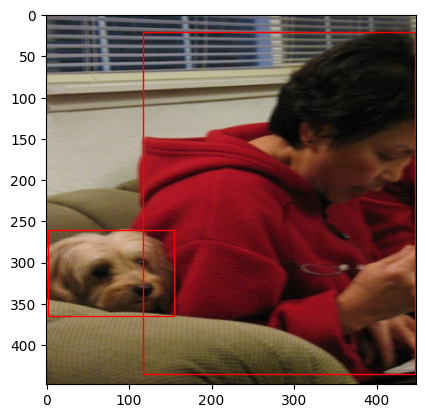

doing stuff


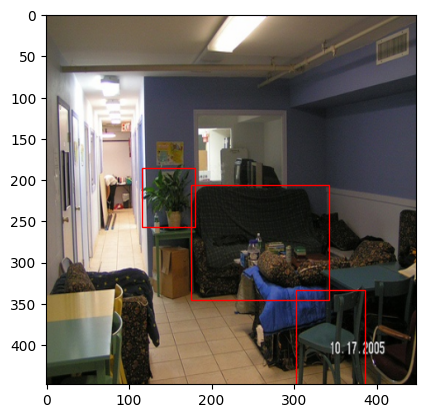

doing stuff


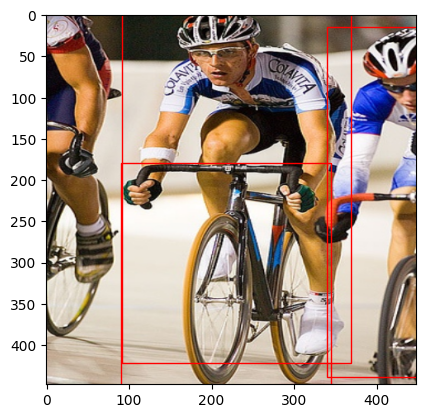

doing stuff


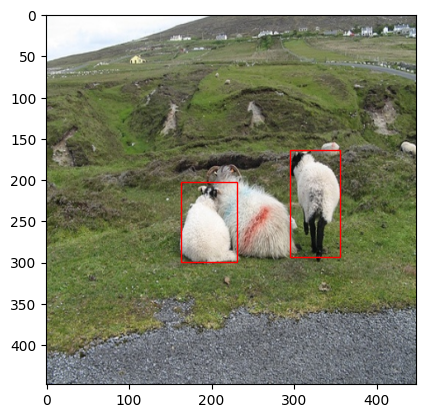

doing stuff


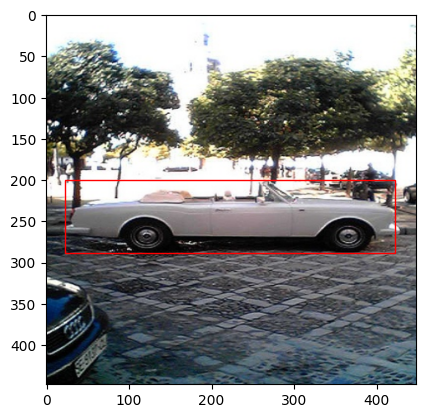

doing stuff


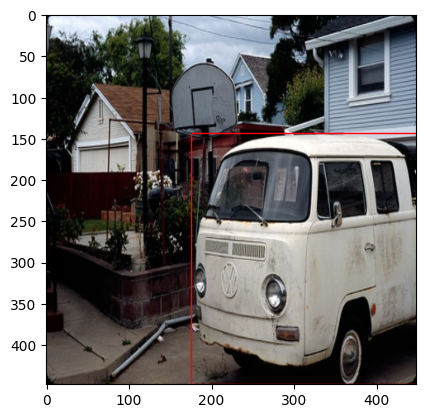

doing stuff


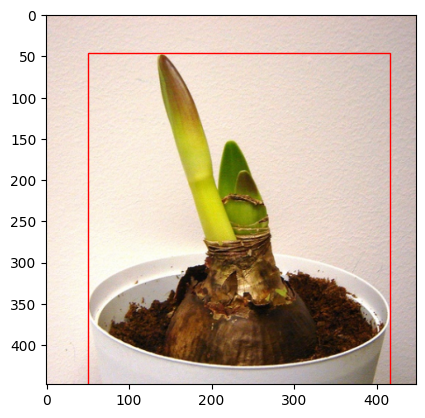

doing stuff


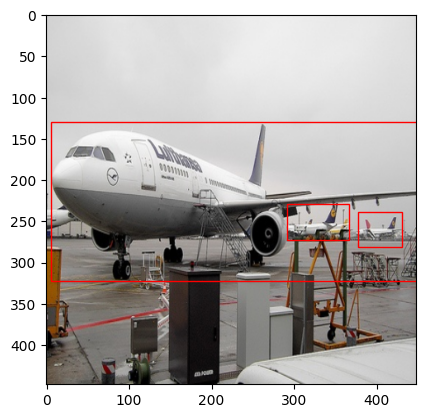

doing stuff


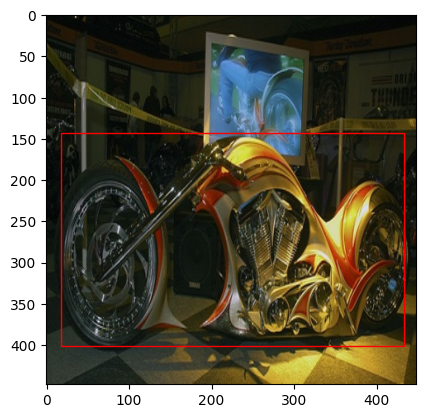

doing stuff


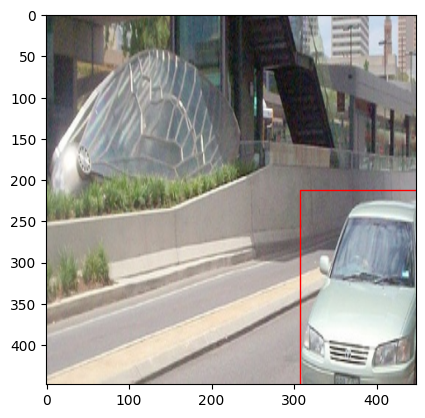

doing stuff


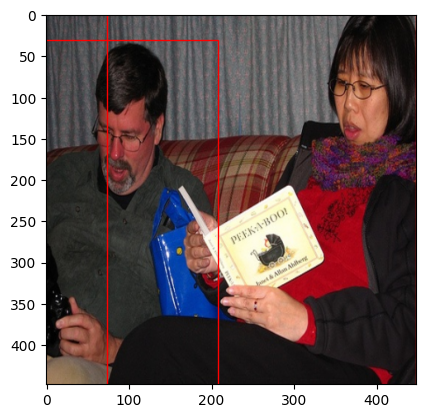

doing stuff


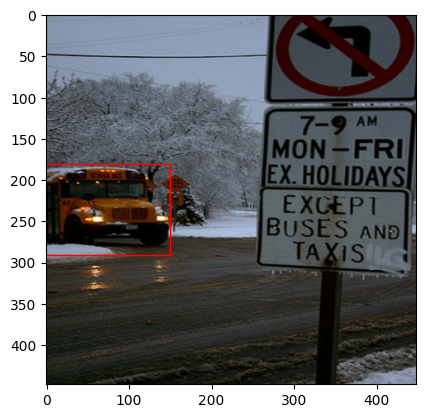

doing stuff


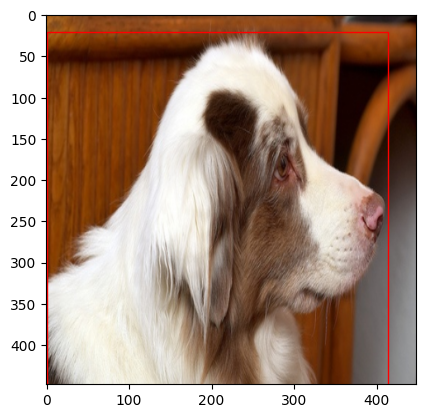

doing stuff


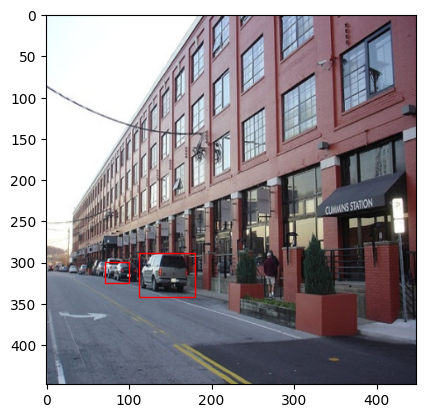

doing stuff


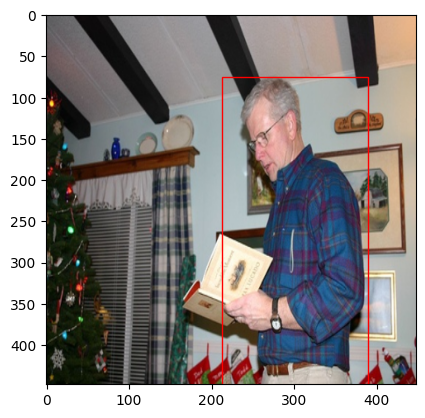

doing stuff


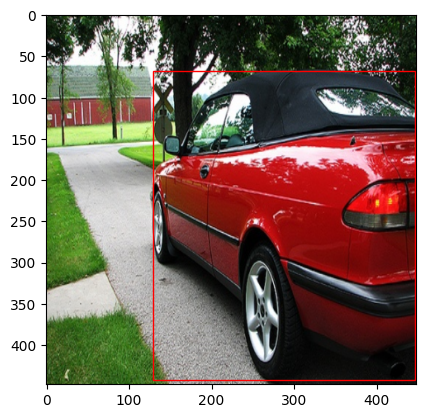

doing stuff


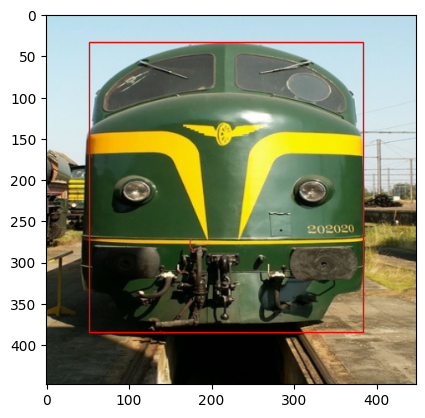

doing stuff


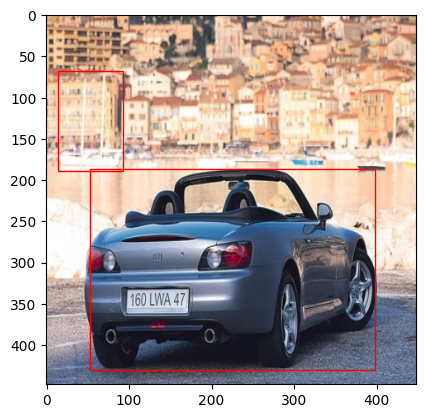

doing stuff


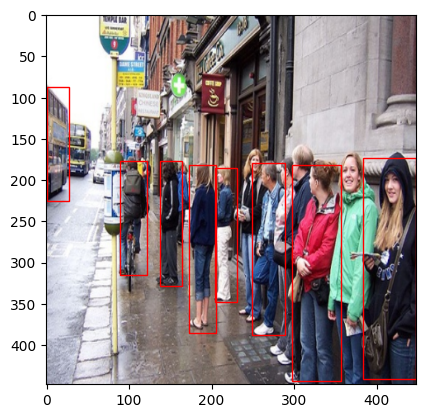

doing stuff


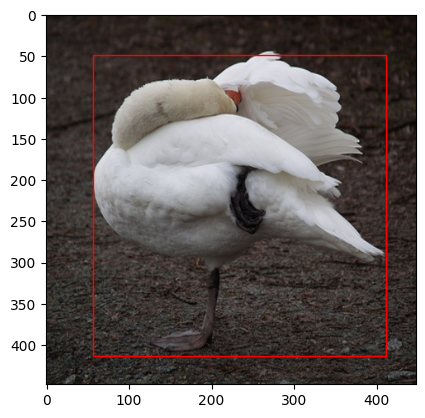

doing stuff


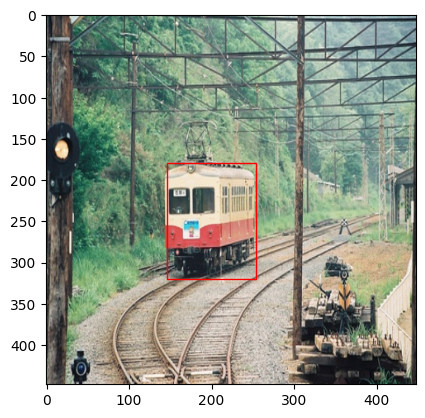

doing stuff


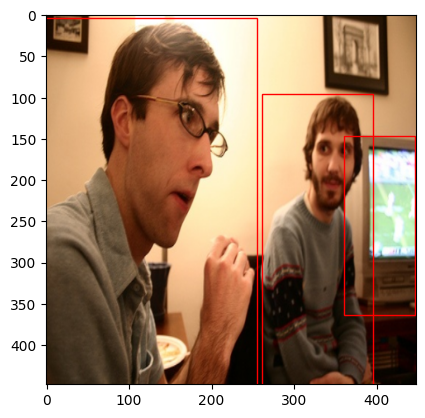

In [34]:
train_dataset = VOCDataset(
        "data/100examples.csv",
        transform=transform,
        img_dir=IMG_DIR,
        label_dir=LABEL_DIR,
    )
test_dataset = VOCDataset(
        "data/test.csv", transform=transform, img_dir=IMG_DIR, label_dir=LABEL_DIR,
    )

train_loader = DataLoader(
        dataset=train_dataset,
        batch_size=BATCH_SIZE,
        # num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
        shuffle=True,
        drop_last=True,
    )

test_loader = DataLoader(
        dataset=test_dataset,
        batch_size=BATCH_SIZE,
        # num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
        shuffle=True,
        drop_last=True,
    )
for x, y in train_loader:
    x = x.to(DEVICE)
    for idx in range(8):
        bboxes = cellboxes_to_boxes(model(x))
        bboxes = non_max_suppression(bboxes[idx], iou_threshold=0.5, threshold=0.4, box_format="midpoint")
        plot_image(x[idx].permute(1,2,0).to("cpu"), bboxes)


        

## Model Architechture:



#### CNN Block:

In [8]:
class CNNBlock(nn.Module):
    def __init__(self, in_channels, out_channels, **kwargs):
        super(CNNBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, bias=False, **kwargs)
        self.batchnorm = nn.BatchNorm2d(out_channels)
        self.leakyrelu = nn.LeakyReLU(0.1)

    def forward(self, x):
        return self.leakyrelu(self.batchnorm(self.conv(x)))

### Architechture:

We use the followin Architechture:
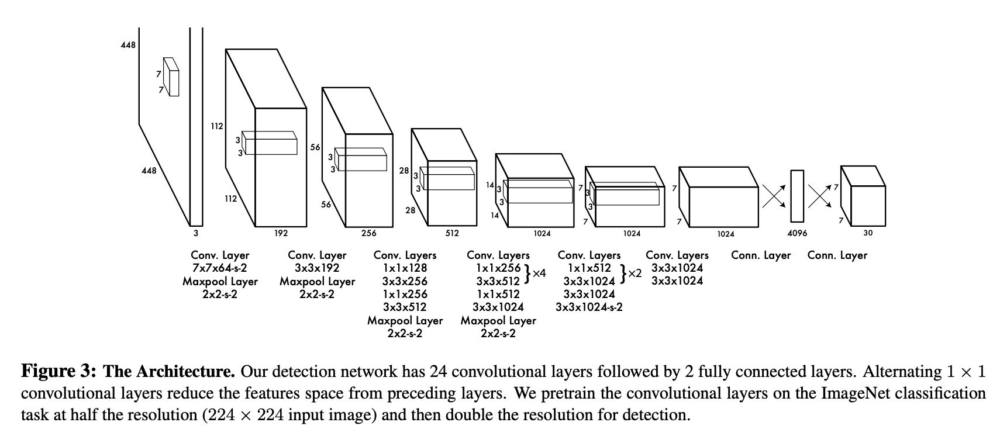

In [9]:
class Yolov1(nn.Module):
    def __init__(self, architecture_config, in_channels=3, **kwargs):
        super(Yolov1, self).__init__()
        self.architecture = architecture_config
        self.in_channels = in_channels
        self.darknet = self._create_conv_layers(self.architecture)
        self.fcs = self._create_fcs(**kwargs)

    def forward(self, x):
        x = self.darknet(x)
        return self.fcs(torch.flatten(x, start_dim=1))

    def _create_conv_layers(self, architecture):
        layers = []
        in_channels = self.in_channels

        for x in architecture:
            if type(x) == tuple:
                layers += [
                    CNNBlock(
                        in_channels, x[1], kernel_size=x[0], stride=x[2], padding=x[3],
                    )
                ]
                in_channels = x[1]

            elif type(x) == str:
                layers += [nn.MaxPool2d(kernel_size=(2, 2), stride=(2, 2))]

            elif type(x) == list:
                conv1 = x[0]
                conv2 = x[1]
                num_repeats = x[2]

                for _ in range(num_repeats):
                    layers += [
                        CNNBlock(
                            in_channels,
                            conv1[1],
                            kernel_size=conv1[0],
                            stride=conv1[2],
                            padding=conv1[3],
                        )
                    ]
                    layers += [
                        CNNBlock(
                            conv1[1],
                            conv2[1],
                            kernel_size=conv2[0],
                            stride=conv2[2],
                            padding=conv2[3],
                        )
                    ]
                    in_channels = conv2[1]

        return nn.Sequential(*layers)

    def _create_fcs(self, split_size, num_boxes, num_classes):
        S, B, C = split_size, num_boxes, num_classes

        return nn.Sequential(
            nn.Flatten(),
            nn.Linear(1024 * S * S, 496),
            nn.Dropout(0.0),
            nn.LeakyReLU(0.1),
            nn.Linear(496, S * S * (C + B * 5)),
        )

### Configuration:
We now choose the CNN layers configuration:

In [10]:
architecture_config = [
    (7, 64, 2, 3),
    "M",
    (3, 192, 1, 1),
    "M",
    (1, 128, 1, 0),
    (3, 256, 1, 1),
    (1, 256, 1, 0),
    (3, 512, 1, 1),
    "M",
    [(1, 256, 1, 0), (3, 512, 1, 1), 4],
    (1, 512, 1, 0),
    (3, 1024, 1, 1),
    "M",
    [(1, 512, 1, 0), (3, 1024, 1, 1), 2],
    (3, 1024, 1, 1),
    (3, 1024, 2, 1),
    (3, 1024, 1, 1),
    (3, 1024, 1, 1),
]

## Traininig:

We use the Loss function presented in the paper:
$$
\begin{align}
&\lambda_{coord} \sum_{i=0}^{S^2}\sum_{j=0}^B \mathbb{1}_{ij}^{obj}[(x_i-\hat{x}_i)^2 + (y_i-\hat{y}_i)^2 ] \\&+ \lambda_{coord} \sum_{i=0}^{S^2}\sum_{j=0}^B \mathbb{1}_{ij}^{obj}[(\sqrt{w_i}-\sqrt{\hat{w}_i})^2 +(\sqrt{h_i}-\sqrt{\hat{h}_i})^2 ]\\
&+ \sum_{i=0}^{S^2}\sum_{j=0}^B \mathbb{1}_{ij}^{obj}(C_i - \hat{C}_i)^2 + \lambda_{noobj}\sum_{i=0}^{S^2}\sum_{j=0}^B \mathbb{1}_{ij}^{noobj}(C_i - \hat{C}_i)^2 \\
&+ \sum_{i=0}^{S^2} \mathbb{1}_{i}^{obj}\sum_{c \in classes}(p_i(c) - \hat{p}_i(c))^2 \\
\end{align}
$$

### Yolo Loss Function:

In [12]:
class YoloLoss(nn.Module):
    """
    Calculate the loss for yolo (v1) model
    """

    def __init__(self, S=7, B=2, C=20):
        super(YoloLoss, self).__init__()
        self.mse = nn.MSELoss(reduction="sum")

        """
        S is split size of image ,
        B is number of boxes,
        C is number of classes,
        """
        self.S = S
        self.B = B
        self.C = C

        # These are from Yolo paper, signifying how much we should
        # pay loss for no object (noobj) and the box coordinates (coord)
        self.lambda_noobj = 0.5
        self.lambda_coord = 5

    def forward(self, predictions, target):
        # predictions are shaped (BATCH_SIZE, S*S(C+B*5) when inputted
        predictions = predictions.reshape(-1, self.S, self.S, self.C + self.B * 5)

        # Calculate IoU for the two predicted bounding boxes with target bbox
        iou_b1 = intersection_over_union(predictions[..., 21:25], target[..., 21:25])
        iou_b2 = intersection_over_union(predictions[..., 26:30], target[..., 21:25])
        ious = torch.cat([iou_b1.unsqueeze(0), iou_b2.unsqueeze(0)], dim=0)

        # Take the box with highest IoU out of the two prediction
        # Note that bestbox will be indices of 0, 1 for which bbox was best
        iou_maxes, bestbox = torch.max(ious, dim=0)
        exists_box = target[..., 20].unsqueeze(3)  # in paper this is Iobj_i

        ## Box Coordinates:

        # Set boxes with no object in them to 0. We only take out one of the two 
        # predictions, which is the one with highest Iou calculated previously.
        box_predictions = exists_box * (
            (
                bestbox * predictions[..., 26:30]
                + (1 - bestbox) * predictions[..., 21:25]
            )
        )

        box_targets = exists_box * target[..., 21:25]

        # Take sqrt of width, height of boxes to ensure that
        box_predictions[..., 2:4] = torch.sign(box_predictions[..., 2:4]) * torch.sqrt(
            torch.abs(box_predictions[..., 2:4] + 1e-6)
        )
        box_targets[..., 2:4] = torch.sqrt(box_targets[..., 2:4])

        box_loss = self.mse(
            torch.flatten(box_predictions, end_dim=-2),
            torch.flatten(box_targets, end_dim=-2),
        )

        ## Objecy Loss:

        # pred_box is the confidence score for the bbox with highest IoU
        pred_box = (
            bestbox * predictions[..., 25:26] + (1 - bestbox) * predictions[..., 20:21]
        )

        object_loss = self.mse(
            torch.flatten(exists_box * pred_box),
            torch.flatten(exists_box * target[..., 20:21]),
        )

        ## No Object Loss

        no_object_loss = self.mse(
            torch.flatten((1 - exists_box) * predictions[..., 20:21], start_dim=1),
            torch.flatten((1 - exists_box) * target[..., 20:21], start_dim=1),
        )

        no_object_loss += self.mse(
            torch.flatten((1 - exists_box) * predictions[..., 25:26], start_dim=1),
            torch.flatten((1 - exists_box) * target[..., 20:21], start_dim=1)
        )

        ## Class Loss:

        class_loss = self.mse(
            torch.flatten(exists_box * predictions[..., :20], end_dim=-2,),
            torch.flatten(exists_box * target[..., :20], end_dim=-2,),
        )

        loss = (
            self.lambda_coord * box_loss  # first two rows in paper
            + object_loss  # third row in paper
            + self.lambda_noobj * no_object_loss  # forth row
            + class_loss  # fifth row
        )

        return loss

In [13]:
seed = 123
torch.manual_seed(seed)

# Hyperparameters etc. 
LEARNING_RATE = 2e-5

BATCH_SIZE = 16 # Ran out of Vram at 64 ant 32
WEIGHT_DECAY = 0
EPOCHS = 250
# NUM_WORKERS = 0
PIN_MEMORY = True
LOAD_MODEL = False
# LOAD_MODEL_FILE = "overfit.pth.tar"
IMG_DIR = "data/images"
LABEL_DIR = "data/labels"


class Compose(object):
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, img, bboxes):
        for t in self.transforms:
            img, bboxes = t(img), bboxes

        return img, bboxes


transform = Compose([transforms.Resize((448, 448)), transforms.ToTensor(),])


def train_fn(train_loader, model, optimizer, loss_fn):
    loop = tqdm(train_loader, leave=True)
    mean_loss = []

    for batch_idx, (x, y) in enumerate(loop):
        x, y = x.to(DEVICE), y.to(DEVICE)
        out = model(x)
        loss = loss_fn(out, y)
        mean_loss.append(loss.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # update progress bar
        loop.set_postfix(loss=loss.item())

    print(f"Mean loss was {sum(mean_loss)/len(mean_loss)}")

    

In [14]:
model = Yolov1(architecture_config, split_size=7, num_boxes=2, num_classes=20).to(DEVICE)
optimizer = optim.Adam(
    model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY
)
model.to(DEVICE)
loss_fn = YoloLoss()

In [15]:


if LOAD_MODEL:
    load_checkpoint(torch.load(LOAD_MODEL_FILE), model, optimizer)

train_dataset = VOCDataset(
    "data/train.csv",
    transform=transform,
    img_dir=IMG_DIR,
    label_dir=LABEL_DIR,
)

test_dataset = VOCDataset(
    "data/test.csv", transform=transform, img_dir=IMG_DIR, label_dir=LABEL_DIR,
)

train_loader = DataLoader(
    dataset=train_dataset,
    batch_size=BATCH_SIZE,
    pin_memory=PIN_MEMORY,
    shuffle=True,
    drop_last=True,
)

test_loader = DataLoader(
    dataset=test_dataset,
    batch_size=BATCH_SIZE,
    pin_memory=PIN_MEMORY,
    shuffle=True,
    drop_last=True,
)

Loss_list = []

for epoch in range(EPOCHS):


    pred_boxes, target_boxes = get_bboxes(
        train_loader, model, iou_threshold=0.5, threshold=0.4
    )

    mean_avg_prec = mean_average_precision(
        pred_boxes, target_boxes, iou_threshold=0.5, box_format="midpoint"
    )
    print(f"Train mAP: {mean_avg_prec}")
    Loss_list += [mean_avg_prec]
    train_fn(train_loader, model, optimizer, loss_fn)


Train mAP: 0.0


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:33<00:00,  3.78it/s, loss=165]


Mean loss was 210.46591092816175
Train mAP: 0.0036646947264671326


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:34<00:00,  3.77it/s, loss=160]


Mean loss was 155.5836207613032
Train mAP: 0.01126142032444477


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:32<00:00,  3.80it/s, loss=217]


Mean loss was 145.91559888592542
Train mAP: 0.00679513206705451


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:34<00:00,  3.77it/s, loss=112]


Mean loss was 140.24720066889572
Train mAP: 0.011148149147629738


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:32<00:00,  3.80it/s, loss=112]


Mean loss was 134.1346514718445
Train mAP: 0.011914802715182304


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:32<00:00,  3.79it/s, loss=174]


Mean loss was 128.6686469212722
Train mAP: 0.010527470149099827


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:35<00:00,  3.75it/s, loss=149]


Mean loss was 122.00522690630973
Train mAP: 0.019482355564832687


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:33<00:00,  3.77it/s, loss=145]


Mean loss was 114.89788794010244
Train mAP: 0.03158913552761078


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:34<00:00,  3.77it/s, loss=75.5]


Mean loss was 106.35197056930808
Train mAP: 0.04142450541257858


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:36<00:00,  3.74it/s, loss=115]


Mean loss was 96.64174301619687
Train mAP: 0.061082612723112106


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:33<00:00,  3.77it/s, loss=93.1]


Mean loss was 86.57788637482221
Train mAP: 0.060881175100803375


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:35<00:00,  3.75it/s, loss=71.7]


Mean loss was 77.39739497348926
Train mAP: 0.0691351369023323


100%|█████████████████████████████████████████████████████████████████████| 1034/1034 [04:33<00:00,  3.78it/s, loss=52]


Mean loss was 69.5340673863542
Train mAP: 0.15659646689891815


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:35<00:00,  3.75it/s, loss=70.6]


Mean loss was 62.92059514139792
Train mAP: 0.2335704267024994


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:33<00:00,  3.77it/s, loss=43.9]


Mean loss was 57.41982571991085
Train mAP: 0.26058173179626465


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.72it/s, loss=31.5]


Mean loss was 52.96466130675384
Train mAP: 0.4087976813316345


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:35<00:00,  3.75it/s, loss=36.9]


Mean loss was 49.0988937171331
Train mAP: 0.3542904555797577


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:36<00:00,  3.74it/s, loss=48.2]


Mean loss was 46.864302174035075
Train mAP: 0.2993320822715759


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:35<00:00,  3.75it/s, loss=57.5]


Mean loss was 45.76053859924671
Train mAP: 0.4567980170249939


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.72it/s, loss=59.5]


Mean loss was 39.564849873806565
Train mAP: 0.4071043133735657


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:35<00:00,  3.75it/s, loss=35.3]


Mean loss was 38.91928719459696
Train mAP: 0.3575526177883148


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:36<00:00,  3.74it/s, loss=28.9]


Mean loss was 36.993259704781686
Train mAP: 0.5150067210197449


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:36<00:00,  3.73it/s, loss=29.6]


Mean loss was 35.11539813213238
Train mAP: 0.5965219736099243


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:36<00:00,  3.74it/s, loss=25.8]


Mean loss was 33.20386003663969
Train mAP: 0.5850228667259216


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=28.7]


Mean loss was 32.790285989440385
Train mAP: 0.610742449760437


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:36<00:00,  3.74it/s, loss=22.6]


Mean loss was 30.61913765791076
Train mAP: 0.617929995059967


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:36<00:00,  3.74it/s, loss=19.9]


Mean loss was 31.996134587367223
Train mAP: 0.5604385137557983


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:36<00:00,  3.74it/s, loss=30.7]


Mean loss was 28.283417366920634
Train mAP: 0.7070240378379822


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.72it/s, loss=32.7]


Mean loss was 25.439548804174308
Train mAP: 0.6864007711410522


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:36<00:00,  3.74it/s, loss=33.6]


Mean loss was 26.20784455987425
Train mAP: 0.5820792317390442


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:35<00:00,  3.75it/s, loss=21.7]


Mean loss was 24.966234579768816
Train mAP: 0.5312455892562866


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:34<00:00,  3.76it/s, loss=20.2]


Mean loss was 24.182617573950232
Train mAP: 0.6793505549430847


100%|█████████████████████████████████████████████████████████████████████| 1034/1034 [04:32<00:00,  3.79it/s, loss=20]


Mean loss was 24.988594181533017
Train mAP: 0.5024694204330444


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:33<00:00,  3.78it/s, loss=19.5]


Mean loss was 23.432881526836344
Train mAP: 0.7209795713424683


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:34<00:00,  3.77it/s, loss=22.2]


Mean loss was 21.08998171734395
Train mAP: 0.6535965204238892


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:34<00:00,  3.76it/s, loss=12.9]


Mean loss was 20.141029404025936
Train mAP: 0.7595044374465942


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:34<00:00,  3.76it/s, loss=17.1]


Mean loss was 23.339575283301407
Train mAP: 0.5553101897239685


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:35<00:00,  3.75it/s, loss=13.3]


Mean loss was 21.288400554103593
Train mAP: 0.5860358476638794


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=25.8]


Mean loss was 19.314141523446057
Train mAP: 0.13837328553199768


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=26.9]


Mean loss was 19.139583060081968
Train mAP: 0.6777037382125854


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:34<00:00,  3.77it/s, loss=16.8]


Mean loss was 16.678666748437937
Train mAP: 0.6471468806266785


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:35<00:00,  3.75it/s, loss=13.1]


Mean loss was 16.669627654483286
Train mAP: 0.5172773599624634


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=14.9]


Mean loss was 18.370619258290333
Train mAP: 0.5869987607002258


100%|█████████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=38]


Mean loss was 17.70771960548091
Train mAP: 0.5112152099609375


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=25.6]


Mean loss was 17.461180636684485
Train mAP: 0.47852975130081177


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:48<00:00,  3.58it/s, loss=11.1]


Mean loss was 16.96790982030577
Train mAP: 0.6005122065544128


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:47<00:00,  3.60it/s, loss=20.6]


Mean loss was 20.62053305683099
Train mAP: 0.719580352306366


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:52<00:00,  3.53it/s, loss=21.8]


Mean loss was 15.69507870176083
Train mAP: 0.5536350607872009


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:53<00:00,  3.53it/s, loss=9.81]


Mean loss was 11.888951296963128
Train mAP: 0.6907707452774048


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:57<00:00,  3.48it/s, loss=8.57]


Mean loss was 11.519446511333177
Train mAP: 0.6982513666152954


100%|█████████████████████████████████████████████████████████████████████| 1034/1034 [04:59<00:00,  3.45it/s, loss=11]


Mean loss was 13.833488813451918
Train mAP: 0.693996250629425


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.68it/s, loss=9.43]


Mean loss was 15.077038907912529
Train mAP: 0.6672676801681519


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.69it/s, loss=29.4]


Mean loss was 14.180620448501704
Train mAP: 0.6474832892417908


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.69it/s, loss=9.25]


Mean loss was 14.285235454312145
Train mAP: 0.773551881313324


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=14.8]


Mean loss was 13.81628734968617
Train mAP: 0.608059287071228


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=19.8]


Mean loss was 13.130155251611823
Train mAP: 0.59083092212677


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:41<00:00,  3.68it/s, loss=13.4]


Mean loss was 12.82597779812619
Train mAP: 0.6420643925666809


100%|█████████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=11]


Mean loss was 12.793547866884007
Train mAP: 0.7300559878349304


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:41<00:00,  3.67it/s, loss=14.1]


Mean loss was 13.005397421709574
Train mAP: 0.6687420606613159


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.68it/s, loss=9.26]


Mean loss was 13.609494298293004
Train mAP: 0.6696938276290894


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:41<00:00,  3.67it/s, loss=13.8]


Mean loss was 12.78607050869866
Train mAP: 0.6383534669876099


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.68it/s, loss=6.95]


Mean loss was 11.22844252365009
Train mAP: 0.6303628087043762


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.68it/s, loss=32.5]


Mean loss was 11.145050425132885
Train mAP: 0.6766506433486938


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.68it/s, loss=5.8]


Mean loss was 11.149431663970653
Train mAP: 0.6557295918464661


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:43<00:00,  3.65it/s, loss=9.16]


Mean loss was 13.587666240374862
Train mAP: 0.650784969329834


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.68it/s, loss=8.45]


Mean loss was 9.830575874050075
Train mAP: 0.5402922034263611


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.69it/s, loss=12.5]


Mean loss was 9.31346393830541
Train mAP: 0.6032140254974365


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:41<00:00,  3.68it/s, loss=16.1]


Mean loss was 11.102062489124055
Train mAP: 0.7131059169769287


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:42<00:00,  3.66it/s, loss=7.47]


Mean loss was 10.788823376310633
Train mAP: 0.6341208219528198


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:41<00:00,  3.67it/s, loss=9.4]


Mean loss was 9.312916101985097
Train mAP: 0.7134608626365662


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:43<00:00,  3.65it/s, loss=14.7]


Mean loss was 9.37441835919939
Train mAP: 0.7256156206130981


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:42<00:00,  3.66it/s, loss=7.99]


Mean loss was 10.604384006799075
Train mAP: 0.6397920846939087


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:44<00:00,  3.64it/s, loss=5.84]


Mean loss was 11.033374221458656
Train mAP: 0.5283599495887756


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:42<00:00,  3.66it/s, loss=7.03]


Mean loss was 9.294399592124748
Train mAP: 0.6109359860420227


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.69it/s, loss=4.95]


Mean loss was 8.281885406265406
Train mAP: 0.6218648552894592


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=7.74]


Mean loss was 8.553516061439735
Train mAP: 0.732085645198822


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.72it/s, loss=5.75]


Mean loss was 9.885853962003608
Train mAP: 0.8268482089042664


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:35<00:00,  3.75it/s, loss=8.49]


Mean loss was 9.768280966830668
Train mAP: 0.8409011960029602


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:35<00:00,  3.76it/s, loss=10.5]


Mean loss was 9.125830101551816
Train mAP: 0.8089383840560913


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:35<00:00,  3.75it/s, loss=14.9]


Mean loss was 9.337763112103223
Train mAP: 0.6535236239433289


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.72it/s, loss=9.23]


Mean loss was 9.91248961435757
Train mAP: 0.8164167404174805


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=6.12]


Mean loss was 8.686883348560887
Train mAP: 0.862881064414978


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.72it/s, loss=8.88]


Mean loss was 7.252963347407328
Train mAP: 0.6671022176742554


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=7.48]


Mean loss was 7.440549669920591
Train mAP: 0.6994397044181824


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.72it/s, loss=18.8]


Mean loss was 7.857156296993824
Train mAP: 0.6876851916313171


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=4.54]


Mean loss was 9.046107134689906
Train mAP: 0.5710796117782593


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=6.69]


Mean loss was 8.311984824488656
Train mAP: 0.7171028852462769


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.72it/s, loss=7.25]


Mean loss was 7.753038809423981
Train mAP: 0.8007173538208008


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.72it/s, loss=15.8]


Mean loss was 7.011107246695912
Train mAP: 0.6457141637802124


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=8.59]


Mean loss was 7.19423308663027
Train mAP: 0.6223300099372864


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.72it/s, loss=5.74]


Mean loss was 8.246429104177817
Train mAP: 0.878341794013977


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.72it/s, loss=7.1]


Mean loss was 7.896354333575044
Train mAP: 0.8474225997924805


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=6.62]


Mean loss was 6.0578603977391525
Train mAP: 0.8539050221443176


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:36<00:00,  3.73it/s, loss=7.64]


Mean loss was 7.150334559049551
Train mAP: 0.8882269859313965


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=12.2]


Mean loss was 6.753810796562431
Train mAP: 0.8672569394111633


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=8.13]


Mean loss was 6.648588544164912
Train mAP: 0.6240849494934082


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.72it/s, loss=5.91]


Mean loss was 6.30661521174691
Train mAP: 0.8313788175582886


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=8.23]


Mean loss was 7.453297894051734
Train mAP: 0.6760124564170837


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=5.19]


Mean loss was 7.308627887897381
Train mAP: 0.8319455981254578


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=3.11]


Mean loss was 6.763755745998434
Train mAP: 0.8263415098190308


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=4.34]


Mean loss was 6.052769402470764
Train mAP: 0.801437497138977


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=17.2]


Mean loss was 5.588124740515733
Train mAP: 0.7953854203224182


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:36<00:00,  3.74it/s, loss=3.97]


Mean loss was 5.8474806459544935
Train mAP: 0.8541261553764343


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.72it/s, loss=4.52]


Mean loss was 6.720710619505876
Train mAP: 0.8529933094978333


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.72it/s, loss=9.84]


Mean loss was 6.373506474079892
Train mAP: 0.8741072416305542


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=3.63]


Mean loss was 5.442022757096724
Train mAP: 0.8602625131607056


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.71it/s, loss=6.2]


Mean loss was 5.17306451779039
Train mAP: 0.8668807148933411


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=4.36]


Mean loss was 5.766512723218081
Train mAP: 0.8964788317680359


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.72it/s, loss=6.45]


Mean loss was 5.528484388984149
Train mAP: 0.8968583941459656


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.72it/s, loss=11.4]


Mean loss was 5.897590863866086
Train mAP: 0.7398427128791809


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.69it/s, loss=5.63]


Mean loss was 5.601358780777892
Train mAP: 0.8014214634895325


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.72it/s, loss=5.34]


Mean loss was 4.978346714659862
Train mAP: 0.8732503056526184


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=2.82]


Mean loss was 4.981640462026836
Train mAP: 0.834092915058136


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.69it/s, loss=11.7]


Mean loss was 6.1353767971927935
Train mAP: 0.8823474049568176


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=3.13]


Mean loss was 5.033161159871395
Train mAP: 0.9071114659309387


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=3.43]


Mean loss was 4.568942864812781
Train mAP: 0.8948366045951843


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.72it/s, loss=4.04]


Mean loss was 4.570429557757866
Train mAP: 0.8935449719429016


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=2.88]


Mean loss was 5.246102755028229
Train mAP: 0.9009243845939636


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=3.2]


Mean loss was 5.294795999905127
Train mAP: 0.9138171076774597


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=3.06]


Mean loss was 4.766236496386722
Train mAP: 0.9143396615982056


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=2.72]


Mean loss was 4.076504449088062
Train mAP: 0.9144202470779419


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=6.3]


Mean loss was 4.360751633026153
Train mAP: 0.8983794450759888


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=4.47]


Mean loss was 4.811119874971747
Train mAP: 0.8999426960945129


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=3.71]


Mean loss was 4.5453256368637085
Train mAP: 0.9113057255744934


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.72it/s, loss=3.42]


Mean loss was 4.373472015793134
Train mAP: 0.9167419672012329


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.72it/s, loss=3.36]


Mean loss was 4.536917067358065
Train mAP: 0.9060664176940918


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.72it/s, loss=2.18]


Mean loss was 4.282297780481483
Train mAP: 0.9074398279190063


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=2.95]


Mean loss was 4.409913492041354
Train mAP: 0.9145094752311707


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.72it/s, loss=5.44]


Mean loss was 4.666775941387597
Train mAP: 0.8797980546951294


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=3.09]


Mean loss was 4.285909951194343
Train mAP: 0.9180322885513306


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.72it/s, loss=3.81]


Mean loss was 3.8050263138988725
Train mAP: 0.9150525331497192


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.72it/s, loss=3.93]


Mean loss was 3.5861355755730338
Train mAP: 0.9178587198257446


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=2.76]


Mean loss was 3.939147665837286
Train mAP: 0.9092790484428406


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=5.15]


Mean loss was 4.411829078105248
Train mAP: 0.9041593670845032


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=3.12]


Mean loss was 4.4620928903843495
Train mAP: 0.9147106409072876


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=7.46]


Mean loss was 3.558459505813495
Train mAP: 0.7773705720901489


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.69it/s, loss=2.89]


Mean loss was 3.6509090050968487
Train mAP: 0.9199075698852539


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.72it/s, loss=3.56]


Mean loss was 3.9743131387625716
Train mAP: 0.9132272601127625


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=2.74]


Mean loss was 4.605709955701514
Train mAP: 0.9209126234054565


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.72it/s, loss=2.99]


Mean loss was 3.434374123984656
Train mAP: 0.9262803792953491


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=2.43]


Mean loss was 3.0655296968306978
Train mAP: 0.9178388714790344


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=2.76]


Mean loss was 3.544109882999435
Train mAP: 0.9121038317680359


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.72it/s, loss=4.06]


Mean loss was 3.952776236160581
Train mAP: 0.9057580232620239


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=3.31]


Mean loss was 3.697732274260235
Train mAP: 0.9090784192085266


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=2.3]


Mean loss was 3.3964221040561537
Train mAP: 0.9138291478157043


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=3.32]


Mean loss was 3.544058447880256
Train mAP: 0.9145866632461548


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.72it/s, loss=4.37]


Mean loss was 3.639695988171797
Train mAP: 0.915235161781311


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=2.59]


Mean loss was 3.4275828303635927
Train mAP: 0.920845627784729


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.69it/s, loss=3.14]


Mean loss was 3.384181544444086
Train mAP: 0.9243744611740112


100%|██████████████████████████████████████████████████████████████████| 1034/1034 [4:15:52<00:00, 14.85s/it, loss=2.8]


Mean loss was 3.3683577312491617
Train mAP: 0.9198806881904602


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:41<00:00,  3.68it/s, loss=1.92]


Mean loss was 3.142768916355111
Train mAP: 0.9215492010116577


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=2.88]


Mean loss was 2.854698759559506
Train mAP: 0.9125553965568542


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=2.9]


Mean loss was 3.1456693726766503
Train mAP: 0.920434832572937


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.71it/s, loss=2.75]


Mean loss was 3.3462516461396357
Train mAP: 0.9143754839897156


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:42<00:00,  3.67it/s, loss=3.59]


Mean loss was 3.6809557799675017
Train mAP: 0.919200599193573


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.69it/s, loss=4.93]


Mean loss was 3.2665844429392417
Train mAP: 0.9290372133255005


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.69it/s, loss=2.62]


Mean loss was 2.305672541865989
Train mAP: 0.9248656034469604


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=2.51]


Mean loss was 2.438050956168073
Train mAP: 0.9170144200325012


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:41<00:00,  3.67it/s, loss=2.63]


Mean loss was 3.209856764145008
Train mAP: 0.9050601720809937


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=2.29]


Mean loss was 3.534235908284178
Train mAP: 0.905806839466095


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:42<00:00,  3.67it/s, loss=1.87]


Mean loss was 3.656154801236822
Train mAP: 0.9213564991950989


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=2.07]


Mean loss was 2.5497693296096773
Train mAP: 0.9308989644050598


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.69it/s, loss=1.68]


Mean loss was 2.2897517841374158
Train mAP: 0.9272818565368652


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=2.39]


Mean loss was 2.7145160118431373
Train mAP: 0.9173343777656555


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:41<00:00,  3.67it/s, loss=1.59]


Mean loss was 3.112239339365489
Train mAP: 0.9189178347587585


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=4.42]


Mean loss was 3.1195833731435485
Train mAP: 0.9139357805252075


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=2.3]


Mean loss was 3.4213637337232696
Train mAP: 0.9216972589492798


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=9.49]


Mean loss was 2.747004165640191
Train mAP: 0.8736708760261536


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=2.15]


Mean loss was 2.7499331880353637
Train mAP: 0.923369288444519


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=2.2]


Mean loss was 2.4667177736989765
Train mAP: 0.9239768981933594


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=2.53]


Mean loss was 2.7679076071403474
Train mAP: 0.9184240102767944


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.72it/s, loss=4.88]


Mean loss was 2.8766206532889687
Train mAP: 0.9128034710884094


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=2.1]


Mean loss was 3.118660189658115
Train mAP: 0.9253946542739868


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=2.96]


Mean loss was 2.7267845596981233
Train mAP: 0.9248167276382446


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.69it/s, loss=1.27]


Mean loss was 2.5770538148381954
Train mAP: 0.9240455627441406


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.69it/s, loss=3.51]


Mean loss was 2.714741682522071
Train mAP: 0.9217020273208618


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:42<00:00,  3.66it/s, loss=4.08]


Mean loss was 2.9461960576950235
Train mAP: 0.9090161323547363


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=2.6]


Mean loss was 3.1633687256844407
Train mAP: 0.9281935691833496


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:42<00:00,  3.67it/s, loss=2.29]


Mean loss was 2.5143491698994627
Train mAP: 0.928658664226532


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:36<00:00,  3.74it/s, loss=2.68]


Mean loss was 1.7593799118723583
Train mAP: 0.8932445645332336


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.72it/s, loss=1.64]


Mean loss was 2.6078057566971107
Train mAP: 0.9245349168777466


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:42<00:00,  3.66it/s, loss=2.66]


Mean loss was 2.347392583435232
Train mAP: 0.9212983846664429


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=3.44]


Mean loss was 2.7044987826098326
Train mAP: 0.9165068864822388


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=3.13]


Mean loss was 2.627168672919504
Train mAP: 0.9196687936782837


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:41<00:00,  3.67it/s, loss=2.1]


Mean loss was 3.019004471528
Train mAP: 0.9300792813301086


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:44<00:00,  3.63it/s, loss=2.49]


Mean loss was 2.0600977591896426
Train mAP: 0.9331005811691284


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:36<00:00,  3.74it/s, loss=1.19]


Mean loss was 1.9330089008669789
Train mAP: 0.9205522537231445


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.72it/s, loss=2.2]


Mean loss was 2.7628891735519616
Train mAP: 0.92372065782547


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=3.92]


Mean loss was 2.625827545930615
Train mAP: 0.9235435724258423


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.68it/s, loss=1.38]


Mean loss was 2.52657400316611
Train mAP: 0.92896568775177


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.69it/s, loss=3.18]


Mean loss was 2.185192071722831
Train mAP: 0.9164886474609375


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=2.74]


Mean loss was 2.462077674021804
Train mAP: 0.9150410890579224


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:42<00:00,  3.66it/s, loss=4.08]


Mean loss was 2.856500985544009
Train mAP: 0.9173016548156738


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:42<00:00,  3.65it/s, loss=1.65]


Mean loss was 2.7668454286208237
Train mAP: 0.924235999584198


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:42<00:00,  3.66it/s, loss=1.94]


Mean loss was 2.2427016650569738
Train mAP: 0.9220389127731323


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:43<00:00,  3.65it/s, loss=2.21]


Mean loss was 2.081733269663798
Train mAP: 0.9226970672607422


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.68it/s, loss=2.26]


Mean loss was 2.956264475904535
Train mAP: 0.9240971803665161


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:35<00:00,  3.75it/s, loss=1.29]


Mean loss was 1.9835880677174322
Train mAP: 0.9278976321220398


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:35<00:00,  3.75it/s, loss=1.38]


Mean loss was 1.7140453527006005
Train mAP: 0.9280452728271484


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=2.11]


Mean loss was 2.1251546447120275
Train mAP: 0.922040581703186


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:43<00:00,  3.65it/s, loss=2.02]


Mean loss was 2.512079230475472
Train mAP: 0.9216612577438354


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:41<00:00,  3.68it/s, loss=1.81]


Mean loss was 2.3604051407347333
Train mAP: 0.9222512245178223


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=1.63]


Mean loss was 2.3157916462167782
Train mAP: 0.9219306707382202


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:41<00:00,  3.67it/s, loss=2.11]


Mean loss was 2.4250723387563253
Train mAP: 0.920387864112854


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=1.34]


Mean loss was 2.415335434433109
Train mAP: 0.9248266220092773


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:36<00:00,  3.74it/s, loss=2.03]


Mean loss was 1.9860696921150274
Train mAP: 0.9233672022819519


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.72it/s, loss=1.56]


Mean loss was 2.089821925938014
Train mAP: 0.9198949933052063


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=2.07]


Mean loss was 2.307174120177614
Train mAP: 0.9193475842475891


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.72it/s, loss=1.41]


Mean loss was 2.325315851480403
Train mAP: 0.9284412264823914


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.72it/s, loss=1.44]


Mean loss was 2.1883431190563587
Train mAP: 0.9201900362968445


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=1.07]


Mean loss was 2.0876886640572687
Train mAP: 0.9239513278007507


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.72it/s, loss=5.78]


Mean loss was 2.0942909016023523
Train mAP: 0.9294581413269043


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:35<00:00,  3.75it/s, loss=1.89]


Mean loss was 2.876776231730238
Train mAP: 0.9307186007499695


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:36<00:00,  3.73it/s, loss=4.84]


Mean loss was 1.9895951854537026
Train mAP: 0.9304211735725403


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:35<00:00,  3.75it/s, loss=1.32]


Mean loss was 1.5548460162469913
Train mAP: 0.929840087890625


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:35<00:00,  3.75it/s, loss=1.74]


Mean loss was 1.6118789056398883
Train mAP: 0.9248678088188171


100%|██████████████████████████████████████████████████████████████████| 1034/1034 [04:35<00:00,  3.75it/s, loss=0.981]


Mean loss was 2.0674939662275738
Train mAP: 0.921907901763916


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:36<00:00,  3.75it/s, loss=1.73]


Mean loss was 2.176535196472644
Train mAP: 0.9247614145278931


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:36<00:00,  3.74it/s, loss=2.27]


Mean loss was 1.913459714538124
Train mAP: 0.9307233691215515


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:36<00:00,  3.74it/s, loss=1.09]


Mean loss was 1.933231420570001
Train mAP: 0.9261552095413208


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:36<00:00,  3.75it/s, loss=1.32]


Mean loss was 2.018639364314033
Train mAP: 0.9260643124580383


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:36<00:00,  3.74it/s, loss=1.6]


Mean loss was 1.981868038267416
Train mAP: 0.9204480051994324


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:42<00:00,  3.66it/s, loss=3.65]


Mean loss was 2.1080466873180015
Train mAP: 0.9255071878433228


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:41<00:00,  3.68it/s, loss=1.71]


Mean loss was 2.1114590779033344
Train mAP: 0.9238508939743042


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:43<00:00,  3.65it/s, loss=1.86]


Mean loss was 1.9526063406721075
Train mAP: 0.9288710355758667


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:41<00:00,  3.67it/s, loss=1.16]


Mean loss was 1.8480600265054685
Train mAP: 0.9263837933540344


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.68it/s, loss=1.72]


Mean loss was 1.8397385007638765
Train mAP: 0.9235835075378418


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=1.71]


Mean loss was 2.2214707104449576
Train mAP: 0.9296554327011108


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=1.52]


Mean loss was 1.9091113947576897
Train mAP: 0.9304341077804565


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.72it/s, loss=1.15]


Mean loss was 1.648111558456255
Train mAP: 0.9261664152145386


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=1.98]


Mean loss was 2.787383780085141
Train mAP: 0.9313775300979614


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.72it/s, loss=1.15]


Mean loss was 1.6714551341026387
Train mAP: 0.9325824975967407


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=2.44]


Mean loss was 1.4912923200333372
Train mAP: 0.9211751818656921


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.73it/s, loss=1.1]


Mean loss was 1.917961949536602
Train mAP: 0.9292038679122925


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:38<00:00,  3.71it/s, loss=0.95]


Mean loss was 1.5116064338665636
Train mAP: 0.9292535781860352


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=1.08]


Mean loss was 1.5039873948064948
Train mAP: 0.9221026301383972


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:43<00:00,  3.65it/s, loss=2.58]


Mean loss was 1.724380327954283
Train mAP: 0.9208388328552246


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:42<00:00,  3.66it/s, loss=2.32]


Mean loss was 2.3302637876463583
Train mAP: 0.9190208315849304


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=2.09]


Mean loss was 1.948716170322042
Train mAP: 0.9302473068237305


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.72it/s, loss=2.12]


Mean loss was 1.494961683823938
Train mAP: 0.9302617311477661


100%|██████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=0.937]


Mean loss was 1.5299821377838143
Train mAP: 0.9262795448303223


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.69it/s, loss=4.86]


Mean loss was 1.8701636596966527
Train mAP: 0.9191898107528687


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.69it/s, loss=3.31]


Mean loss was 2.053143319931436
Train mAP: 0.9229810833930969


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:37<00:00,  3.72it/s, loss=2.27]


Mean loss was 2.1261884666388453
Train mAP: 0.9254620671272278


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:40<00:00,  3.68it/s, loss=1.76]


Mean loss was 1.8051248394543704
Train mAP: 0.9301199913024902


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.71it/s, loss=1.01]


Mean loss was 1.5558462287632593
Train mAP: 0.9292807579040527


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=1.26]


Mean loss was 1.4231660721726298
Train mAP: 0.9273327589035034


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=1.15]


Mean loss was 1.5912358472033672
Train mAP: 0.9215706586837769


100%|███████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=2.59]


Mean loss was 2.3743275574028377
Train mAP: 0.9188989400863647


100%|████████████████████████████████████████████████████████████████████| 1034/1034 [04:39<00:00,  3.70it/s, loss=1.5]

Mean loss was 1.846299073221144


In [16]:
torch.save(model.state_dict(), "YOLOv1.pt")

### Appendix:

Helper functions:


In [3]:
def non_max_suppression(bboxes, iou_threshold, threshold, box_format="corners"):
    """
    Does Non Max Suppression given bboxes
    Parameters:
        bboxes (list): list of lists containing all bboxes with each bboxes
        specified as [class_pred, prob_score, x1, y1, x2, y2]
        iou_threshold (float): threshold where predicted bboxes is correct
        threshold (float): threshold to remove predicted bboxes (independent of IoU) 
        box_format (str): "midpoint" or "corners" used to specify bboxes
    Returns:
        list: bboxes after performing NMS given a specific IoU threshold
    """

    assert type(bboxes) == list

    bboxes = [box for box in bboxes if box[1] > threshold]
    bboxes = sorted(bboxes, key=lambda x: x[1], reverse=True)
    bboxes_after_nms = []

    while bboxes:
        chosen_box = bboxes.pop(0)

        bboxes = [
            box
            for box in bboxes
            if box[0] != chosen_box[0]
            or intersection_over_union(
                torch.tensor(chosen_box[2:]),
                torch.tensor(box[2:]),
                box_format=box_format,
            )
            < iou_threshold
        ]

        bboxes_after_nms.append(chosen_box)

    return bboxes_after_nms


In [4]:
def mean_average_precision(
    pred_boxes, true_boxes, iou_threshold=0.5, box_format="midpoint", num_classes=20
):
    """
    Calculates mean average precision 
    Parameters:
        pred_boxes (list): list of lists containing all bboxes with each bboxes
        specified as [train_idx, class_prediction, prob_score, x1, y1, x2, y2]
        true_boxes (list): Similar as pred_boxes except all the correct ones 
        iou_threshold (float): threshold where predicted bboxes is correct
        box_format (str): "midpoint" or "corners" used to specify bboxes
        num_classes (int): number of classes
    Returns:
        float: mAP value across all classes given a specific IoU threshold 
    """

    # list storing all AP for respective classes
    average_precisions = []

    # used for numerical stability later on
    epsilon = 1e-6

    for c in range(num_classes):
        detections = []
        ground_truths = []

        # Go through all predictions and targets,
        # and only add the ones that belong to the
        # current class c
        for detection in pred_boxes:
            if detection[1] == c:
                detections.append(detection)

        for true_box in true_boxes:
            if true_box[1] == c:
                ground_truths.append(true_box)

        # find the amount of bboxes for each training example
        # Counter here finds how many ground truth bboxes we get
        # for each training example, so let's say img 0 has 3,
        # img 1 has 5 then we will obtain a dictionary with:
        # amount_bboxes = {0:3, 1:5}
        amount_bboxes = Counter([gt[0] for gt in ground_truths])

        # We then go through each key, val in this dictionary
        # and convert to the following (w.r.t same example):
        # ammount_bboxes = {0:torch.tensor[0,0,0], 1:torch.tensor[0,0,0,0,0]}
        for key, val in amount_bboxes.items():
            amount_bboxes[key] = torch.zeros(val)

        # sort by box probabilities which is index 2
        detections.sort(key=lambda x: x[2], reverse=True)
        TP = torch.zeros((len(detections)))
        FP = torch.zeros((len(detections)))
        total_true_bboxes = len(ground_truths)
        
        # If none exists for this class then we can safely skip
        if total_true_bboxes == 0:
            continue

        for detection_idx, detection in enumerate(detections):
            # Only take out the ground_truths that have the same
            # training idx as detection
            ground_truth_img = [
                bbox for bbox in ground_truths if bbox[0] == detection[0]
            ]

            num_gts = len(ground_truth_img)
            best_iou = 0

            for idx, gt in enumerate(ground_truth_img):
                iou = intersection_over_union(
                    torch.tensor(detection[3:]),
                    torch.tensor(gt[3:]),
                    box_format=box_format,
                )

                if iou > best_iou:
                    best_iou = iou
                    best_gt_idx = idx

            if best_iou > iou_threshold:
                # only detect ground truth detection once
                if amount_bboxes[detection[0]][best_gt_idx] == 0:
                    # true positive and add this bounding box to seen
                    TP[detection_idx] = 1
                    amount_bboxes[detection[0]][best_gt_idx] = 1
                else:
                    FP[detection_idx] = 1

            # if IOU is lower then the detection is a false positive
            else:
                FP[detection_idx] = 1

        TP_cumsum = torch.cumsum(TP, dim=0)
        FP_cumsum = torch.cumsum(FP, dim=0)
        recalls = TP_cumsum / (total_true_bboxes + epsilon)
        precisions = torch.divide(TP_cumsum, (TP_cumsum + FP_cumsum + epsilon))
        precisions = torch.cat((torch.tensor([1]), precisions))
        recalls = torch.cat((torch.tensor([0]), recalls))
        # torch.trapz for numerical integration
        average_precisions.append(torch.trapz(precisions, recalls))

    return sum(average_precisions) / len(average_precisions)


In [26]:
def plot_image(image, boxes):
    """Plots predicted bounding boxes on the image"""
    im = np.array(image)
    height, width, _ = im.shape

    # Create figure and axes
    fig, ax = plt.subplots(1)
    # Display the image
    ax.imshow(im)

    # Create a Rectangle potch
    for box in boxes:
        box = box[2:]
        assert len(box) == 4, "Got more values than in x, y, w, h, in a box!"
        upper_left_x = box[0] - box[2] / 2
        upper_left_y = box[1] - box[3] / 2
        rect = patches.Rectangle(
            (upper_left_x * width, upper_left_y * height),
            box[2] * width,
            box[3] * height,
            linewidth=1,
            edgecolor="r",
            facecolor="none",
        )
        # Add the patch to the Axes
        ax.add_patch(rect)
    print('doing stuff')
    plt.show()

def get_bboxes(
    loader,
    model,
    iou_threshold,
    threshold,
    pred_format="cells",
    box_format="midpoint",
    device="cuda",
):
    all_pred_boxes = []
    all_true_boxes = []

    # make sure model is in eval before get bboxes
    model.eval()
    train_idx = 0

    for batch_idx, (x, labels) in enumerate(loader):
        x = x.to(device)
        labels = labels.to(device)

        with torch.no_grad():
            predictions = model(x)

        batch_size = x.shape[0]
        true_bboxes = cellboxes_to_boxes(labels)
        bboxes = cellboxes_to_boxes(predictions)

        for idx in range(batch_size):
            nms_boxes = non_max_suppression(
                bboxes[idx],
                iou_threshold=iou_threshold,
                threshold=threshold,
                box_format=box_format,
            )


            #if batch_idx == 0 and idx == 0:
            #    plot_image(x[idx].permute(1,2,0).to("cpu"), nms_boxes)
            #    print(nms_boxes)

            for nms_box in nms_boxes:
                all_pred_boxes.append([train_idx] + nms_box)

            for box in true_bboxes[idx]:
                # many will get converted to 0 pred
                if box[1] > threshold:
                    all_true_boxes.append([train_idx] + box)

            train_idx += 1

    model.train()
    return all_pred_boxes, all_true_boxes



def convert_cellboxes(predictions, S=7):
    """
    Converts bounding boxes output from Yolo with
    an image split size of S into entire image ratios
    rather than relative to cell ratios. Tried to do this
    vectorized, but this resulted in quite difficult to read
    code... Use as a black box? Or implement a more intuitive,
    using 2 for loops iterating range(S) and convert them one
    by one, resulting in a slower but more readable implementation.
    """

    predictions = predictions.to("cpu")
    batch_size = predictions.shape[0]
    predictions = predictions.reshape(batch_size, 7, 7, 30)
    bboxes1 = predictions[..., 21:25]
    bboxes2 = predictions[..., 26:30]
    scores = torch.cat(
        (predictions[..., 20].unsqueeze(0), predictions[..., 25].unsqueeze(0)), dim=0
    )
    best_box = scores.argmax(0).unsqueeze(-1)
    best_boxes = bboxes1 * (1 - best_box) + best_box * bboxes2
    cell_indices = torch.arange(7).repeat(batch_size, 7, 1).unsqueeze(-1)
    x = 1 / S * (best_boxes[..., :1] + cell_indices)
    y = 1 / S * (best_boxes[..., 1:2] + cell_indices.permute(0, 2, 1, 3))
    w_y = 1 / S * best_boxes[..., 2:4]
    converted_bboxes = torch.cat((x, y, w_y), dim=-1)
    predicted_class = predictions[..., :20].argmax(-1).unsqueeze(-1)
    best_confidence = torch.max(predictions[..., 20], predictions[..., 25]).unsqueeze(
        -1
    )
    converted_preds = torch.cat(
        (predicted_class, best_confidence, converted_bboxes), dim=-1
    )

    return converted_preds

In [6]:
def cellboxes_to_boxes(out, S=7):
    converted_pred = convert_cellboxes(out).reshape(out.shape[0], S * S, -1)
    converted_pred[..., 0] = converted_pred[..., 0].long()
    all_bboxes = []

    for ex_idx in range(out.shape[0]):
        bboxes = []

        for bbox_idx in range(S * S):
            bboxes.append([x.item() for x in converted_pred[ex_idx, bbox_idx, :]])
        all_bboxes.append(bboxes)

    return all_bboxes

def save_checkpoint(state, filename="my_checkpoint.pth.tar"):
    print("=> Saving checkpoint")
    torch.save(state, filename)


def load_checkpoint(checkpoint, model, optimizer):
    print("=> Loading checkpoint")
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])

In [11]:
def intersection_over_union(boxes_preds, boxes_labels, box_format="midpoint"):

    if box_format == "midpoint":
        box1_x1 = boxes_preds[..., 0:1] - boxes_preds[..., 2:3] / 2
        box1_y1 = boxes_preds[..., 1:2] - boxes_preds[..., 3:4] / 2
        box1_x2 = boxes_preds[..., 0:1] + boxes_preds[..., 2:3] / 2
        box1_y2 = boxes_preds[..., 1:2] + boxes_preds[..., 3:4] / 2
        box2_x1 = boxes_labels[..., 0:1] - boxes_labels[..., 2:3] / 2
        box2_y1 = boxes_labels[..., 1:2] - boxes_labels[..., 3:4] / 2
        box2_x2 = boxes_labels[..., 0:1] + boxes_labels[..., 2:3] / 2
        box2_y2 = boxes_labels[..., 1:2] + boxes_labels[..., 3:4] / 2

    if box_format == "corners":
        box1_x1 = boxes_preds[..., 0:1]
        box1_y1 = boxes_preds[..., 1:2]
        box1_x2 = boxes_preds[..., 2:3]
        box1_y2 = boxes_preds[..., 3:4]  # (N, 1)
        box2_x1 = boxes_labels[..., 0:1]
        box2_y1 = boxes_labels[..., 1:2]
        box2_x2 = boxes_labels[..., 2:3]
        box2_y2 = boxes_labels[..., 3:4]

    x1 = torch.max(box1_x1, box2_x1)
    y1 = torch.max(box1_y1, box2_y1)
    x2 = torch.min(box1_x2, box2_x2)
    y2 = torch.min(box1_y2, box2_y2)

    # .clamp(0) is for the case when they do not intersect
    intersection = (x2 - x1).clamp(0) * (y2 - y1).clamp(0)

    box1_area = abs((box1_x2 - box1_x1) * (box1_y2 - box1_y1))
    box2_area = abs((box2_x2 - box2_x1) * (box2_y2 - box2_y1))

    return intersection / (box1_area + box2_area - intersection + 1e-6)
